## Import required Libraries and Dependencies

In [1]:
import pandas as pd
import seaborn as sns

In [2]:
from pandas_profiling import ProfileReport

In [3]:
from pycaret.datasets import get_data
from pycaret.anomaly import *

In [4]:
pycaret.__version__

'2.3.4'

## Load and Prepare Data

In [5]:
df = get_data('anomaly')

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10
0,0.263995,0.764929,0.138424,0.935242,0.605867,0.518790,0.912225,0.608234,0.723782,0.733591
1,0.546092,0.653975,0.065575,0.227772,0.845269,0.837066,0.272379,0.331679,0.429297,0.367422
2,0.336714,0.538842,0.192801,0.553563,0.074515,0.332993,0.365792,0.861309,0.899017,0.088600
3,0.092108,0.995017,0.014465,0.176371,0.241530,0.514724,0.562208,0.158963,0.073715,0.208463
4,0.325261,0.805968,0.957033,0.331665,0.307923,0.355315,0.501899,0.558449,0.885169,0.182754


In [6]:
df.shape

(1000, 10)

In [7]:
df.dtypes

Col1     float64
Col2     float64
Col3     float64
Col4     float64
Col5     float64
Col6     float64
Col7     float64
Col8     float64
Col9     float64
Col10    float64
dtype: object

## Exploratory Data Analysis

In [8]:
ProfileReport(df)

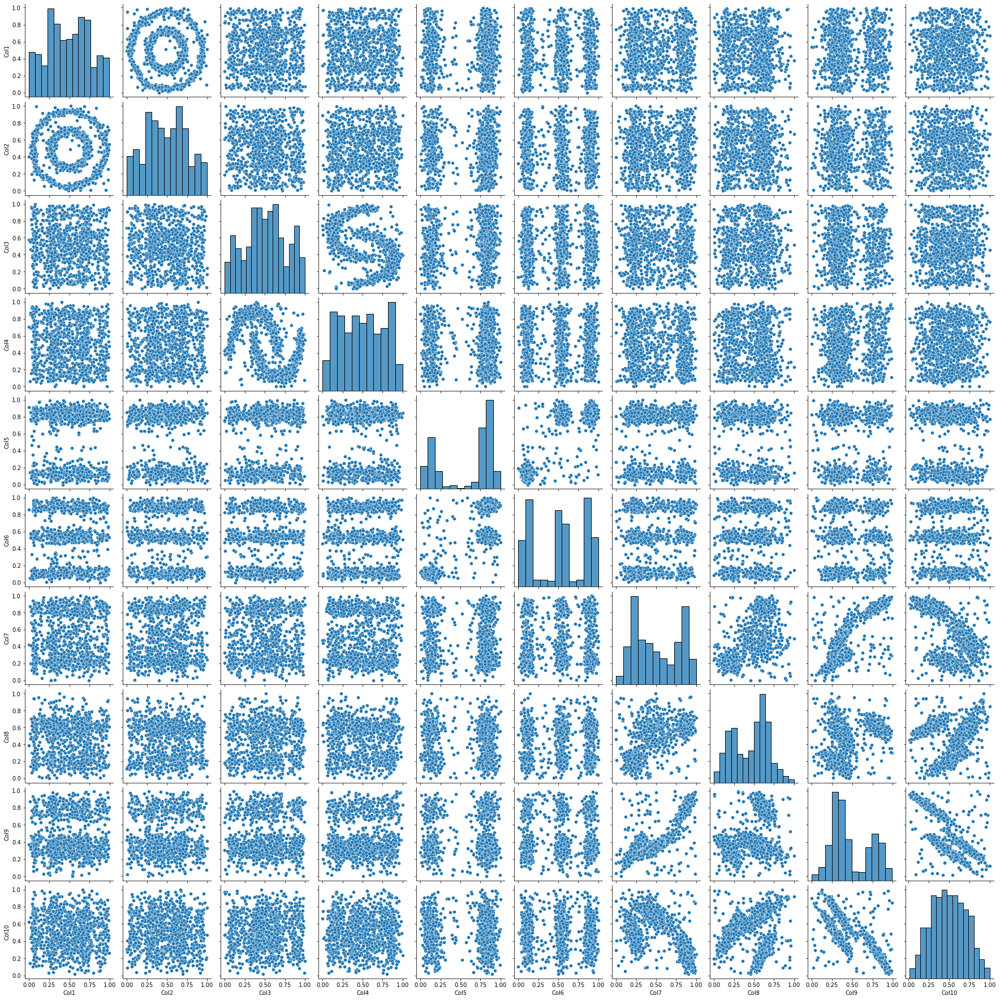

In [9]:
sns.pairplot(df)

## Data Preprocessing 

In [10]:
mySetup = setup(data=df, session_id=123) 

,Description,Value
0,session_id,123
1,Original Data,"(1000, 10)"
2,Missing Values,False
3,Numeric Features,10
4,Categorical Features,0
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(1000, 10)"
9,CPU Jobs,-1


## Building Anomaly Detection Model

In [11]:
models()

,Name,Reference
ID,,
abod,Angle-base Outlier Detection,pyod.models.abod.ABOD
cluster,Clustering-Based Local Outlier,pyod.models.cblof.CBLOF
cof,Connectivity-Based Local Outlier,pyod.models.cof.COF
iforest,Isolation Forest,pyod.models.iforest.IForest
histogram,Histogram-based Outlier Detection,pyod.models.hbos.HBOS
knn,K-Nearest Neighbors Detector,pyod.models.knn.KNN
lof,Local Outlier Factor,pyod.models.lof.LOF
svm,One-class SVM detector,pyod.models.ocsvm.OCSVM
pca,Principal Component Analysis,pyod.models.pca.PCA


In [12]:
iforest = create_model('iforest')
print(iforest)

IForest(behaviour='new', bootstrap=False, contamination=0.05,
    max_features=1.0, max_samples='auto', n_estimators=100, n_jobs=-1,
    random_state=123, verbose=0)


In [13]:
knn = create_model('knn')
print(knn)

KNN(algorithm='auto', contamination=0.05, leaf_size=30, method='largest',
  metric='minkowski', metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
  radius=1.0)


In [14]:
iforest_results = assign_model(iforest)
iforest_results.head(10)

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Anomaly,Anomaly_Score
0,0.263995,0.764929,0.138424,0.935242,0.605867,0.518790,0.912225,0.608234,0.723782,0.733591,0,-0.035865
1,0.546092,0.653975,0.065575,0.227772,0.845269,0.837066,0.272379,0.331679,0.429297,0.367422,0,-0.084927
2,0.336714,0.538842,0.192801,0.553563,0.074515,0.332993,0.365792,0.861309,0.899017,0.088600,1,0.025356
3,0.092108,0.995017,0.014465,0.176371,0.241530,0.514724,0.562208,0.158963,0.073715,0.208463,1,0.042415
4,0.325261,0.805968,0.957033,0.331665,0.307923,0.355315,0.501899,0.558449,0.885169,0.182754,0,-0.023408
5,0.212465,0.780305,0.458444,0.634509,0.373030,0.465651,0.413997,0.013080,0.570250,0.736672,0,-0.009339
6,0.258566,0.437318,0.559648,0.109203,0.994553,0.896994,0.488469,0.251943,0.017265,0.538513,0,-0.041027
7,0.869237,0.277979,0.423076,0.112472,0.183727,0.034960,0.111114,0.249330,0.550683,0.049843,1,0.012853
8,0.197078,0.843918,0.243396,0.281278,0.329148,0.734582,0.191947,0.927804,0.713269,0.891548,1,0.033479
9,0.292985,0.703432,0.439621,0.107868,0.922947,0.253458,0.295652,0.355287,0.980911,0.308864,0,-0.003969


In [15]:
iforest_results.Anomaly.value_counts()

0    950
1     50
Name: Anomaly, dtype: int64

In [16]:
knn_results = assign_model(knn)
knn_results.head(10)

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Anomaly,Anomaly_Score
0,0.263995,0.764929,0.138424,0.935242,0.605867,0.518790,0.912225,0.608234,0.723782,0.733591,0,0.569672
1,0.546092,0.653975,0.065575,0.227772,0.845269,0.837066,0.272379,0.331679,0.429297,0.367422,0,0.484217
2,0.336714,0.538842,0.192801,0.553563,0.074515,0.332993,0.365792,0.861309,0.899017,0.088600,1,0.691915
3,0.092108,0.995017,0.014465,0.176371,0.241530,0.514724,0.562208,0.158963,0.073715,0.208463,1,0.811600
4,0.325261,0.805968,0.957033,0.331665,0.307923,0.355315,0.501899,0.558449,0.885169,0.182754,0,0.634337
5,0.212465,0.780305,0.458444,0.634509,0.373030,0.465651,0.413997,0.013080,0.570250,0.736672,0,0.651934
6,0.258566,0.437318,0.559648,0.109203,0.994553,0.896994,0.488469,0.251943,0.017265,0.538513,0,0.536723
7,0.869237,0.277979,0.423076,0.112472,0.183727,0.034960,0.111114,0.249330,0.550683,0.049843,0,0.643990
8,0.197078,0.843918,0.243396,0.281278,0.329148,0.734582,0.191947,0.927804,0.713269,0.891548,1,0.855695
9,0.292985,0.703432,0.439621,0.107868,0.922947,0.253458,0.295652,0.355287,0.980911,0.308864,1,0.740711


In [17]:
knn_results.Anomaly.value_counts()

0    950
1     50
Name: Anomaly, dtype: int64

## Model Evaluation

In [18]:
plot_model(knn)

In [19]:
plot_model(iforest)

## Model Deployment 

In [20]:
save_model(knn, 'knn')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[],
                                       target='UNSUPERVISED_DUMMY_TARGET',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='most frequent',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None...
                 ('fix_perfect', 'passthrough'),
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'),
                 ('dfs', 'passthrough'), ('pca', 'passthrough'),
                 ['trained_model',
                  KNN

In [21]:
saved_knn_model = load_model('knn')

Transformation Pipeline and Model Successfully Loaded
